# Тестирование атаки патчами на YOLO

## Импорты

In [1]:
import requests
import numpy as np
from PIL import Image
from io import BytesIO
import torch
import pandas as pd
import numpy as np
from torchvision.transforms import transforms
from tqdm import tqdm

from art.estimators.object_detection.pytorch_yolo import PyTorchYolo
from art.attacks.evasion import AdversarialPatchPyTorch


import cv2
import matplotlib
import matplotlib.pyplot as plt


plt.style.use('ggplot')
%matplotlib inline

## Вспомогательные функции

In [47]:
COCO_INSTANCE_CATEGORY_NAMES = ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light',
        'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
        'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee',
        'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard',
        'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
        'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
        'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
        'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
        'teddy bear', 'hair drier', 'toothbrush']

def extract_predictions(predictions_, conf_thresh):
    # Get the predicted class
    predictions_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(predictions_["labels"])]
    #  print("\npredicted classes:", predictions_class)
    if len(predictions_class) < 1:
        return [], [], []
    # Get the predicted bounding boxes
    predictions_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(predictions_["boxes"])]

    # Get the predicted prediction score
    predictions_score = list(predictions_["scores"])
    # print("predicted score:", predictions_score)

    # Get a list of index with score greater than threshold
    threshold = conf_thresh
    predictions_t = [predictions_score.index(x) for x in predictions_score if x > threshold]
    if len(predictions_t) > 0:
        predictions_t = predictions_t  # [-1] #indices where score over threshold
    else:
        # no predictions esxceeding threshold
        return [], [], []
    # predictions in score order
    predictions_boxes = [predictions_boxes[i] for i in predictions_t]
    predictions_class = [predictions_class[i] for i in predictions_t]
    predictions_scores = [predictions_score[i] for i in predictions_t]
    return {
        'labels': predictions_class,
        'boxes': predictions_boxes,
        'scores': predictions_scores,
    }

def plot_image_with_boxes(img, labels, title, confidence=0.15):
    # Make sure image is in uint8 format (HWC, RGB)
    if img.dtype == np.float32 or img.dtype == np.float64:
        img = (img * 255).clip(0, 255).astype(np.uint8)
    elif img.dtype != np.uint8:
        img = img.astype(np.uint8)

    # Convert RGB to BGR for OpenCV
    img_bgr = img.transpose(1, 2, 0).copy() if img.shape[0] == 3 else img.copy()

    text_size = 1
    text_th = 3
    rect_th = 2

    boxes = labels.get('boxes')
    pred_cls = labels.get('labels')
    scores = labels.get('scores')


    for i in range(len(boxes)):
        if scores[i] >= confidence:
            cv2.rectangle(img_bgr, (int(boxes[i][0]), int(boxes[i][1])), (int(boxes[i][2]), int(boxes[i][3])),
                          color=(0, 255, 0), thickness=rect_th)
            # Write the prediction class
            cv2.putText(img_bgr, f"{pred_cls[i]} {round(float(scores[i]), 2)}", (int(boxes[i][0]), int(boxes[i][1])), cv2.FONT_HERSHEY_SIMPLEX, text_size,
                        (0, 255, 0), thickness=text_th)

    plt.figure()
    plt.axis("off")
    plt.title(title)
    plt.imshow(img_bgr.astype(np.uint8), interpolation="nearest")
    # plt.show()

def get_image_with_boxes(img, labels, confidence=0.15):
    text_size = 1
    text_th = 3
    rect_th = 2

    boxes = labels.get('boxes')
    pred_cls = labels.get('labels')
    scores = labels.get('scores')

    for i in range(len(boxes)):
        if scores[i] >= confidence:
            cv2.rectangle(img, (int(boxes[i][0]), int(boxes[i][1])), (int(boxes[i][2]), int(boxes[i][3])),
                          color=(0, 255, 0), thickness=rect_th)
            cv2.putText(img, f"{COCO_INSTANCE_CATEGORY_NAMES[pred_cls[i]]} {round(float(scores[i]), 2)}",
                        (int(boxes[i][0]), int(boxes[i][1]) - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, text_size, (0, 255, 0), thickness=text_th)

    return img

## Загрузка модели и датасета

https://papers.ssrn.com/sol3/papers.cfm?abstract_id=4952353 говорит, что yoloV8s слегка особенная и патчи, которые работают на всех других моделях, не работают на ней

In [57]:
from ultralytics import YOLO
from ultralytics.utils.loss import v8DetectionLoss
from ultralytics.utils import ops

from types import SimpleNamespace

# https://docs.ultralytics.com/models/
MODEL = 'yolov8m.pt'


class YoloWrapper(torch.nn.Module):
    def __init__(self, model, device, **kwargs):
        super().__init__(**kwargs)
        self.orig_model = YOLO(model)
        if device == 'cuda' or device == 'gpu':
            self.orig_model.cuda()
        self.model = self.orig_model.model
        self.predict_count = 0
        self.conf = 0.5
        self.device = device

        for param in self.model.parameters():
            param.requires_grad = False

        self.loss_fn = v8DetectionLoss(self.model, tal_topk=10)
        self.loss_fn.hyp = SimpleNamespace(box=7.5, cls=0.5, dfl=1.5)

    def forward(self, x, targets=None):
        if isinstance(x, torch.Tensor):
            x = x.to(self.device)
        elif isinstance(x, np.ndarray):
            x = torch.from_numpy(x).to(self.device)

        if self.training:

            batch = {
                "batch_idx": targets[:, 0].long(),
                "cls": targets[:, 1].long(),
                "bboxes": targets[:, 2:6].float(),
            }
            loss_total, loss_tensor = self.loss_fn(self.model(x), batch)

            loss_dict = {
                'loss_box': loss_total[0],
                'loss_cls': loss_total[1],
                'loss_dfl': loss_total[2]
            }

            return loss_dict

        else:
            pred = self.model(x)[0]  # (n, 84, 8400)

            boxes = pred[:, 0:4, :]  # (n, 4, 8400)
            class_scores = pred[:, 4:, :]  # (n, 80, 8400)

            # ART requires objectness score for each bbox, so here's a trick:
            objectness, _ = class_scores.max(dim=1)  # (n, 8400)
            objectness = objectness.unsqueeze(1)  # (n, 1, 8400)

            pred = torch.cat([
                boxes,  # (n, 4, 8400)
                objectness,  # (n, 1, 8400)
                class_scores  # (n, 80, 8400)
            ], dim=1)  # -> (n, 85, 8400)

            pred = pred.permute(0, 2, 1)  # (n, 8400, 85)

            return pred

    def predict(self, x, postprocess=False):
        self.orig_model.model.eval()
        results = self.orig_model(torch.tensor(x, device=self.device), verbose=False)
        outputs = []
        for result in results:
            if postprocess:
                boxes = result.boxes.xyxy.cpu().numpy()
                scores = result.boxes.conf.cpu().numpy()
                labels = [result.names.get(int(l), "unk") for l in result.boxes.cls]
            else:
                boxes = result.boxes.xyxy
                scores = result.boxes.conf
                labels = result.boxes.cls.int()

            outputs.append({
                'boxes': boxes,
                'labels': labels,
                'scores': scores
            })
        return outputs

    def train(self, state=True):
        self.model.train() if state else self.model.eval()
        self.training = state


model = YoloWrapper(MODEL, 'cuda')

detector = PyTorchYolo(model=model,
                    device_type='gpu',
                    input_shape=(3, 640, 640),
                    clip_values=(0, 1),
                    attack_losses=("loss_cls",
                                    "loss_box",
                                    "loss_dfl"),)

In [42]:
model.orig_model.device

device(type='cuda', index=0)

In [66]:
from art.attacks.evasion import AdversarialPatchPyTorch

atk = AdversarialPatchPyTorch(estimator=detector,
                              targeted=False,
                              verbose=True,
                              max_iter=100,
                              batch_size=1)
patch = atk.generate(x=coco_images)

Adversarial Patch PyTorch:   0%|          | 0/100 [00:00<?, ?it/s]

In [51]:
NUMBER_CHANNELS = 3
INPUT_SHAPE = (NUMBER_CHANNELS, 640, 640)

transform = transforms.Compose([
        transforms.Resize(INPUT_SHAPE[1], interpolation=transforms.InterpolationMode.BICUBIC),
        transforms.CenterCrop(INPUT_SHAPE[1]),
        transforms.ToTensor()
    ])

urls = ['http://images.cocodataset.org/val2017/000000039769.jpg',
'http://images.cocodataset.org/val2017/000000397133.jpg',
'http://images.cocodataset.org/val2017/000000037777.jpg',
'http://images.cocodataset.org/val2017/000000454661.jpg',
'http://images.cocodataset.org/val2017/000000094852.jpg']
coco_images = []
for url in urls:
    im = Image.open(requests.get(url, stream=True).raw)
    im = transform(im).numpy()
    coco_images.append(im)
coco_images = np.array(coco_images)

## Чистая модель

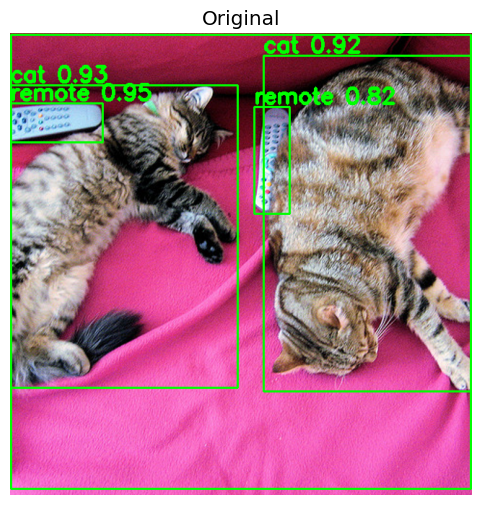

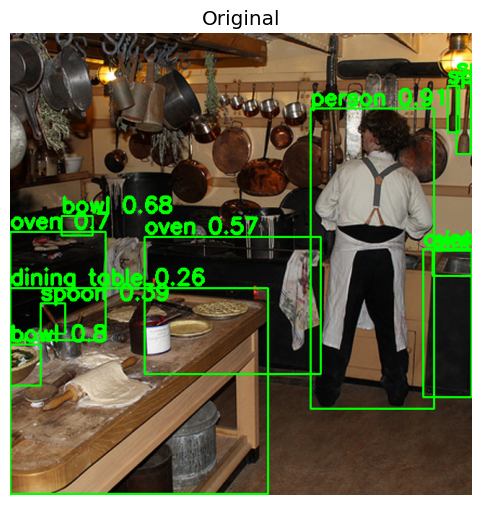

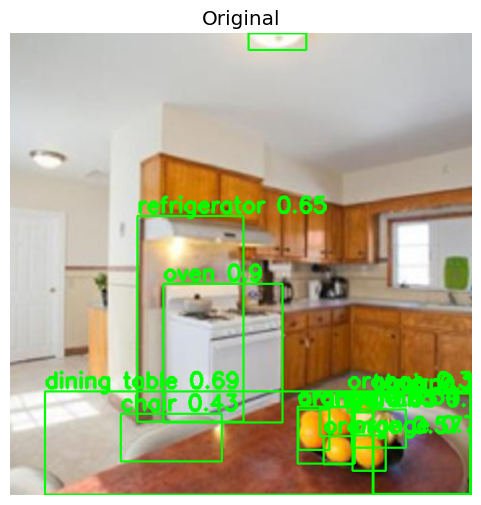

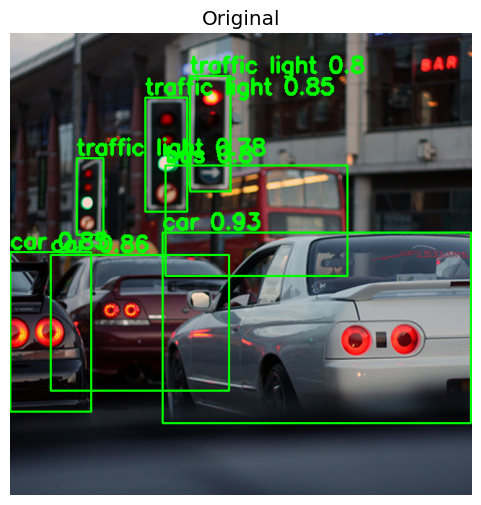

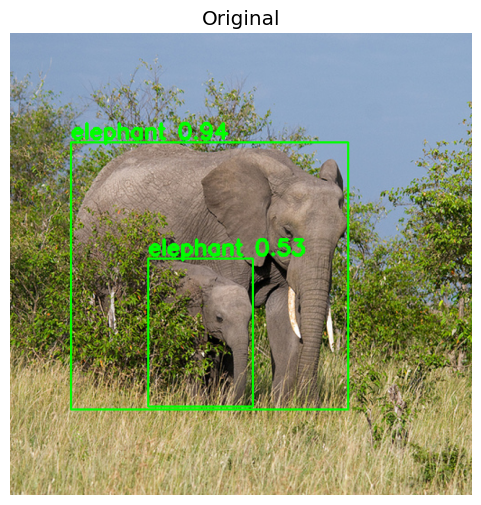

In [16]:
preds = detector.model.predict(coco_images)

for i, pred in enumerate(preds):
    fig, axs = plt.subplots(1, 1, figsize=(18, 6))

    im_orig = (coco_images[i]).transpose(1, 2, 0) * 255
    im_orig_boxed = get_image_with_boxes(im_orig.copy(), preds[i])
    axs.imshow(im_orig_boxed.astype("uint8"))
    axs.set_title("Original")
    axs.axis("off")

Удостоверились, что модель работает как надо, перейдём к созданию патчей

## Создание патчей

In [6]:
coco_images

array([[[[    0.64314,     0.61176,     0.64314, ...,     0.47451,     0.44314,      0.4549],
         [    0.63529,     0.62353,     0.65098, ...,     0.48627,     0.47451,     0.47059],
         [    0.63922,     0.62745,      0.6549, ...,      0.4902,     0.48627,     0.50196],
         ...,
         [    0.98039,     0.98824,     0.98039, ...,     0.85098,         0.8,     0.88627],
         [    0.99216,     0.99216,     0.97647, ...,     0.81176,     0.78824,     0.89804],
         [    0.98431,     0.98039,     0.98039, ...,     0.78824,     0.85098,     0.91373]],

        [[    0.10196,    0.086275,     0.11373, ...,    0.066667,    0.035294,    0.062745],
         [   0.098039,    0.098039,     0.12941, ...,    0.070588,    0.070588,    0.070588],
         [     0.1098,     0.10196,     0.13725, ...,    0.070588,    0.078431,    0.090196],
         ...,
         [    0.47843,     0.50196,     0.47843, ...,     0.25882,     0.21176,     0.30588],
         [    0.48627,     0.5

In [7]:
detector.native_label_is_pytorch_format

True

In [62]:
type(clean_preds[0]['labels'])

list

In [77]:
from art.attacks.evasion.dpatch_robust import RobustDPatch

clean_preds = detector.model.predict(coco_images)

# Создаем атаку Adversarial Patch специально для YOLO
attack = RobustDPatch(
    detector,
    patch_shape=(3, 80, 80),
    patch_location=(320, 320),
    max_iter=10,
    targeted=True,
)
# Генерируем патч
patch = attack.generate(x=coco_images, y=clean_preds)

# Применяем патч к изображениям
patched_images = attack.apply_patch(coco_images)

# Проверяем эффективность атаки
patched_preds = detector.model.predict(patched_images, postprocess=True)

for i in range(len(patched_preds)):
    fig, axs = plt.subplots(1, 2, figsize=(18, 6))

    # 1. Adversarial Image
    im_adv = (patched_images[i]).transpose(1, 2, 0) * 255
    im_adv_boxed = get_image_with_boxes(im_adv.copy(), patched_preds[i])
    axs[0].imshow(im_adv_boxed.astype("uint8"))
    axs[0].set_title("Robust DPatch")
    axs[0].axis("off")

    # 2. Original Image
    im_orig = (coco_images[i]).transpose(1, 2, 0) * 255
    im_orig_boxed = get_image_with_boxes(im_orig.copy(), clean_preds[i])
    axs[1].imshow(im_orig_boxed.astype("uint8"))
    axs[1].set_title("Original")
    axs[1].axis("off")

AttributeError: 'list' object has no attribute 'cpu'

## Untargeted DPatch

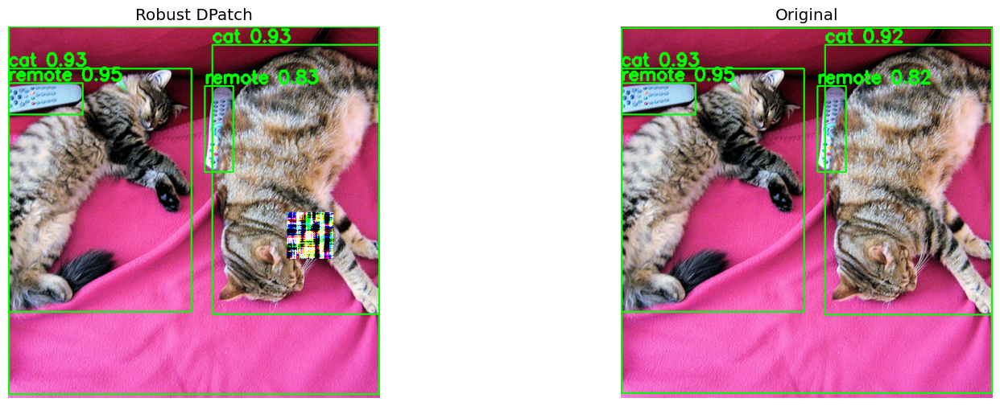

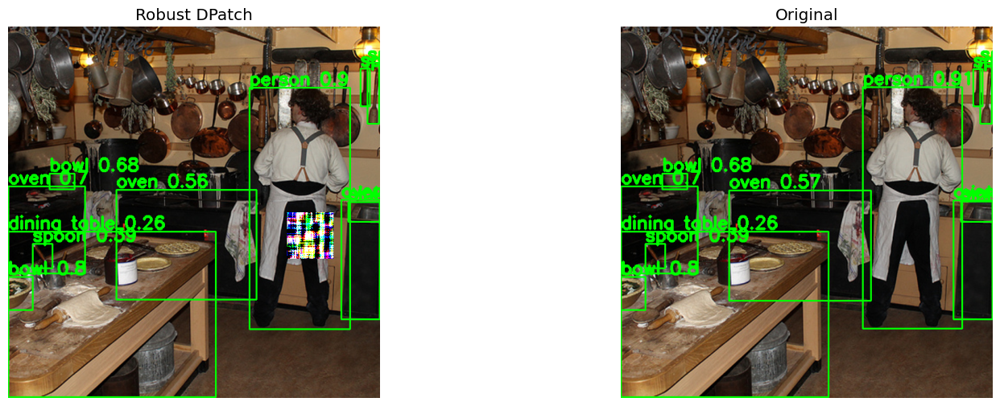

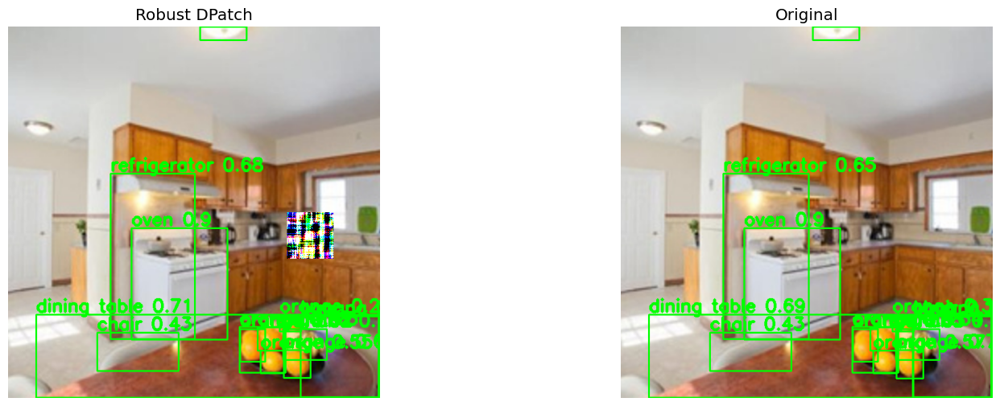

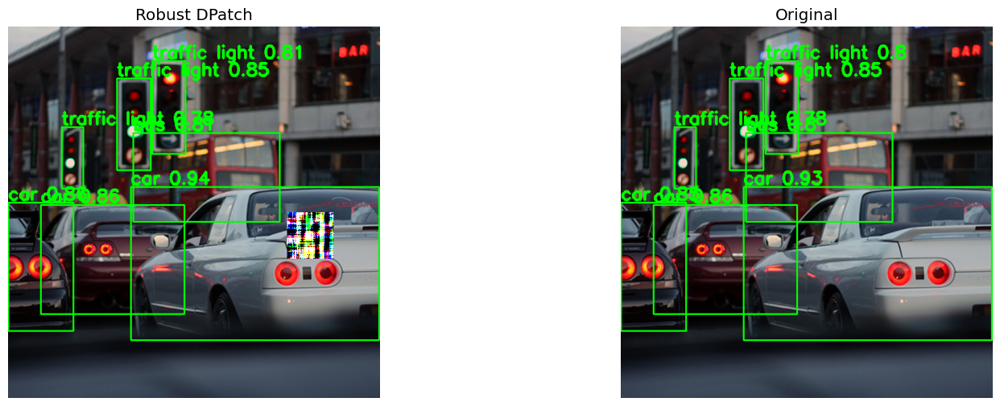

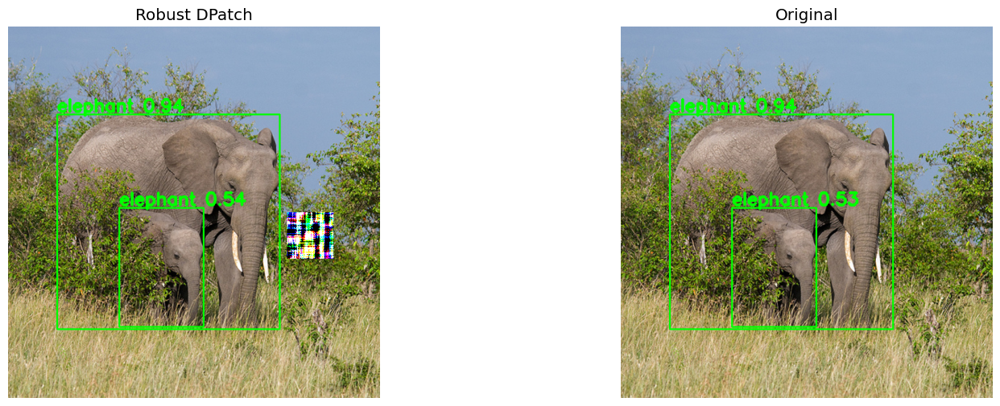

In [20]:
attack.patch_location = (320, 480)
patched_images = attack.apply_patch(coco_images)

# Проверяем эффективность атаки
patched_preds = detector.model.predict(patched_images)

for i in range(len(patched_preds)):
    fig, axs = plt.subplots(1, 2, figsize=(18, 6))

    # 1. Adversarial Image
    im_adv = (patched_images[i]).transpose(1, 2, 0) * 255
    im_adv_boxed = get_image_with_boxes(im_adv.copy(), patched_preds[i])
    axs[0].imshow(im_adv_boxed.astype("uint8"))
    axs[0].set_title("Robust DPatch")
    axs[0].axis("off")

    # 2. Original Image
    im_orig = (coco_images[i]).transpose(1, 2, 0) * 255
    im_orig_boxed = get_image_with_boxes(im_orig.copy(), clean_preds[i])
    axs[1].imshow(im_orig_boxed.astype("uint8"))
    axs[1].set_title("Original")
    axs[1].axis("off")

In [72]:
from PIL import Image
import numpy as np

# 1. Транспонируем в формат (H, W, C)
patch_hwc = np.transpose(patch[0], (1, 2, 0))

# 2. Нормализуем значения (если патч в [-1, 1] или [0, 1])
if patch_hwc.min() < 0:  # Предполагаем, что патч в [-1, 1]
    patch_hwc = (patch_hwc + 1) * 127.5  # Масштабируем в [0, 255]
elif patch_hwc.max() <= 1:  # Если патч в [0, 1]
    patch_hwc = patch_hwc * 255

# 3. Конвертируем в uint8 и сохраняем
patch_uint8 = patch_hwc.astype(np.uint8)
Image.fromarray(patch_uint8).save("adversarial_patch100.png")

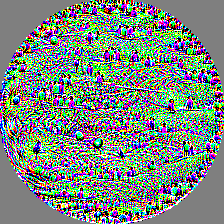

In [73]:
Image.fromarray(patch_uint8)

# Adversarial patch

In [21]:
from torch.utils.data import Dataset, DataLoader

class COCODataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx])
        if img.mode != "RGB": img = img.convert("RGB")
        if self.transform: img = self.transform(img)
        return img

IMAGE_DIR = "coco_data/val2017"
NUMBER_CHANNELS = 3
INPUT_SHAPE = (NUMBER_CHANNELS, 640, 640)

# Преобразования
transform = transforms.Compose([
    transforms.Resize(INPUT_SHAPE[1], interpolation=transforms.InterpolationMode.BICUBIC),
    transforms.CenterCrop(INPUT_SHAPE[1]),
    transforms.ToTensor()
])

# Создание DataLoader
dataset = COCODataset(IMAGE_DIR, transform=transform)
dataloader = DataLoader(
    dataset,
    batch_size=32,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)

In [8]:
import os

IMAGE_DIR = "coco_data/val2017"  # Путь к вашей папке с изображениями
NUMBER_CHANNELS = 3
INPUT_SHAPE = (NUMBER_CHANNELS, 640, 640)

# Преобразования
transform = transforms.Compose([
    transforms.Resize(int(INPUT_SHAPE[1]), interpolation=transforms.InterpolationMode.BICUBIC),
    transforms.CenterCrop(int(INPUT_SHAPE[1])),
    transforms.ToTensor()
])

# Получаем список файлов
image_files = [os.path.join(IMAGE_DIR, f) for f in os.listdir(IMAGE_DIR)
               if f.endswith(('.jpg', '.jpeg', '.png'))][:10]
image_files.sort()  # Для воспроизводимости

# Загрузка и преобразование изображений
coco_images = []
for img_path in image_files:
    try:
        img = Image.open(img_path)
        if img.mode != 'RGB':
            img = img.convert('RGB')
        img_tensor = transform(img)
        coco_images.append(img_tensor.numpy())
    except Exception as e:
        print(f"Ошибка обработки {img_path}: {str(e)}")

# Преобразование в numpy array
coco_images = np.array(coco_images)  # (N, 3, 640, 640)

In [25]:
[type(x) for x in coco_images.shape]

[int, int, int, int]

In [15]:
from art.attacks.evasion import AdversarialPatchPyTorch

atk = AdversarialPatchPyTorch(estimator=detector,
                              targeted=False,
                              verbose=True,
                              max_iter=1)
patch = atk.generate(x=coco_images)

AttributeError: 'YoloWrapper' object has no attribute 'device_type'

ADV Patch PyTorch

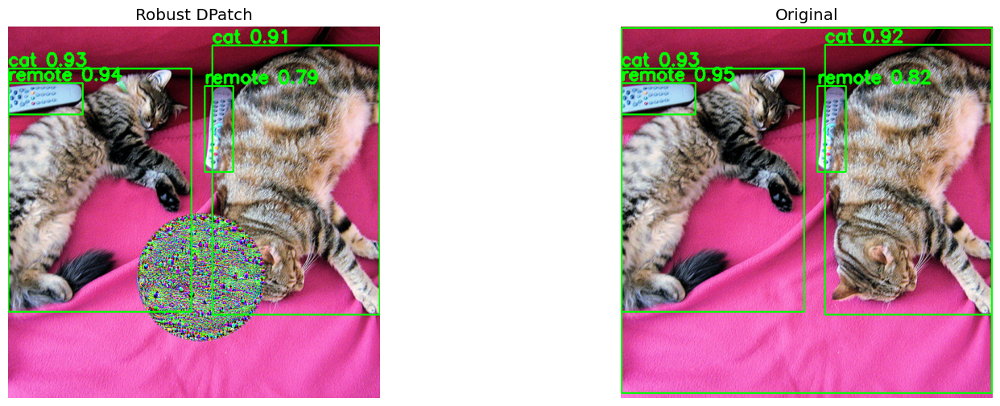

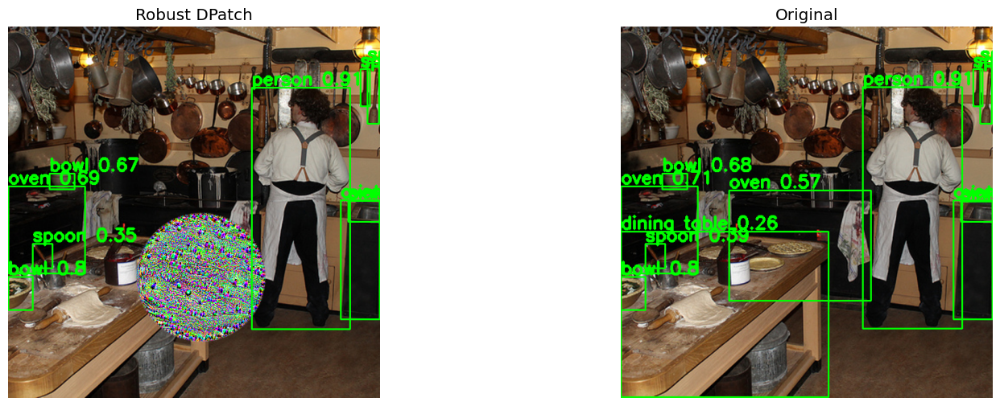

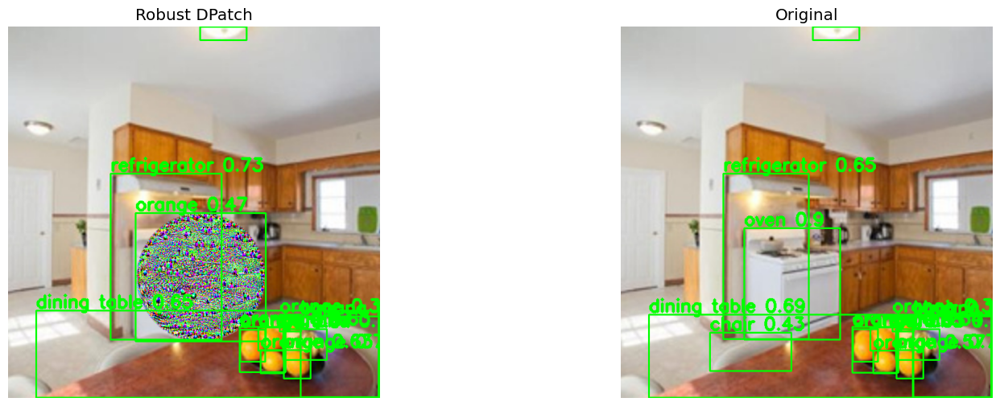

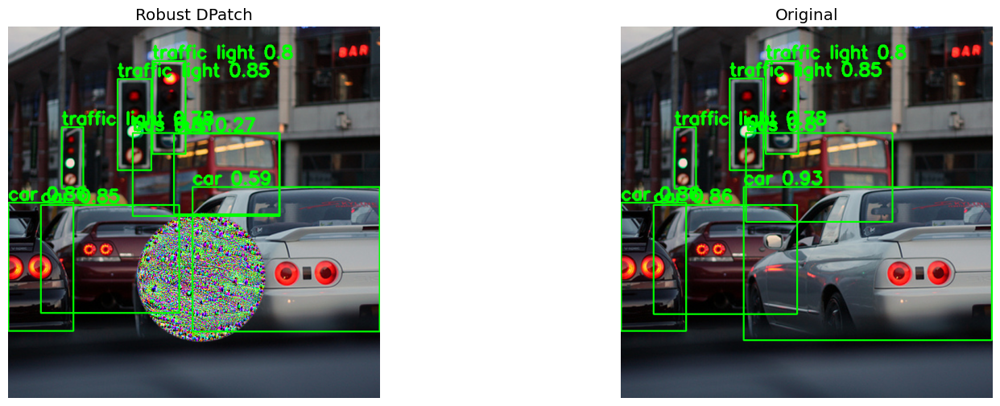

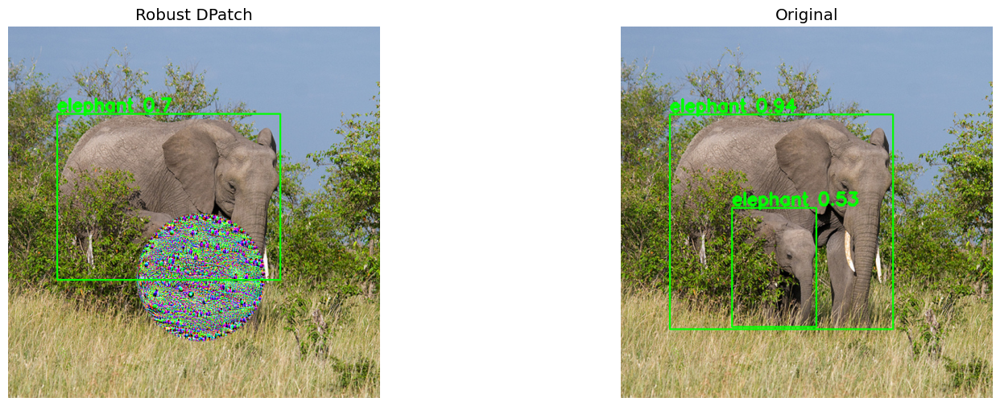

In [75]:
clean_preds = detector.model.predict(coco_images)
atk.patch_location = (220, 320)
patched_images = atk.apply_patch(coco_images, 0.5)

# Проверяем эффективность атаки
patched_preds = detector.model.predict(patched_images)

for i in range(len(patched_preds)):
    fig, axs = plt.subplots(1, 2, figsize=(18, 6))

    # 1. Adversarial Image
    im_adv = (patched_images[i]).transpose(1, 2, 0) * 255
    im_adv_boxed = get_image_with_boxes(im_adv.copy(), patched_preds[i])
    axs[0].imshow(im_adv_boxed.astype("uint8"))
    axs[0].set_title("Robust DPatch")
    axs[0].axis("off")

    # 2. Original Image
    im_orig = (coco_images[i]).transpose(1, 2, 0) * 255
    im_orig_boxed = get_image_with_boxes(im_orig.copy(), clean_preds[i])
    axs[1].imshow(im_orig_boxed.astype("uint8"))
    axs[1].set_title("Original")
    axs[1].axis("off")

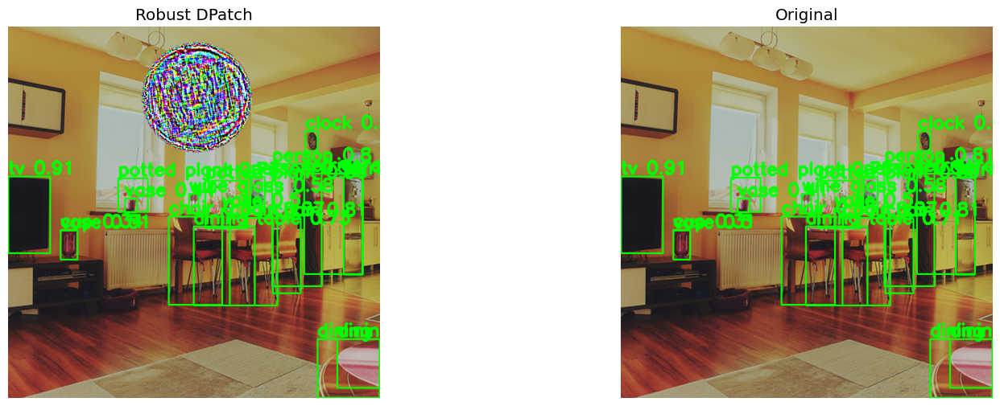

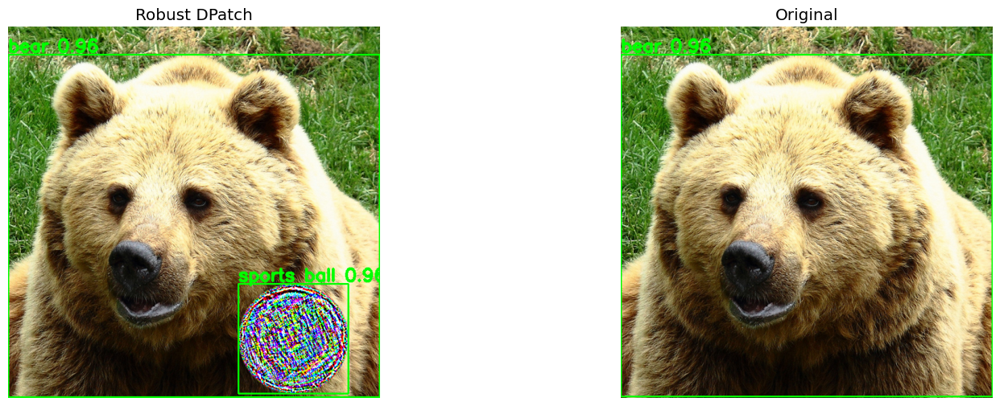

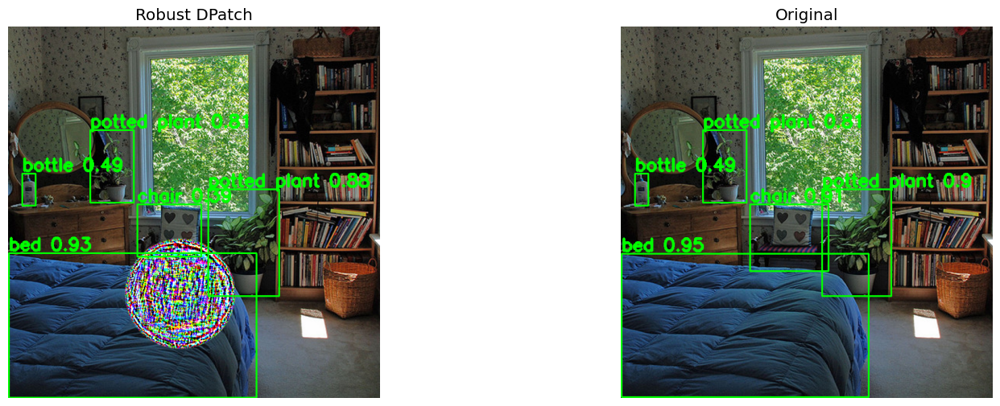

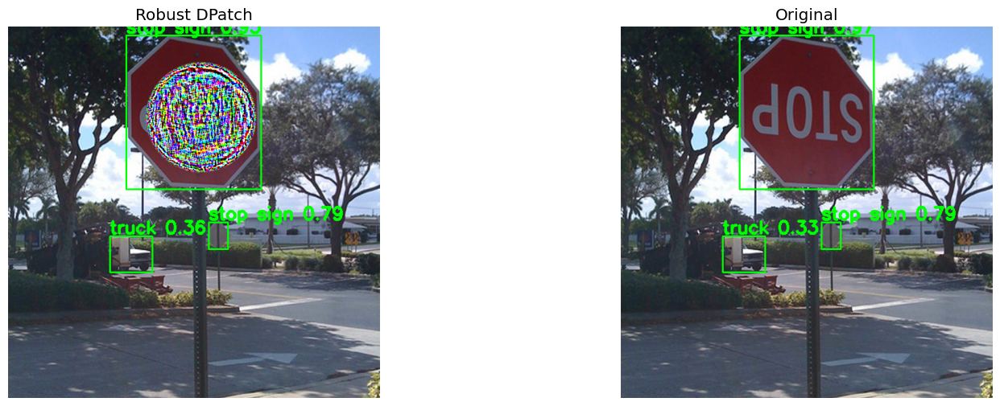

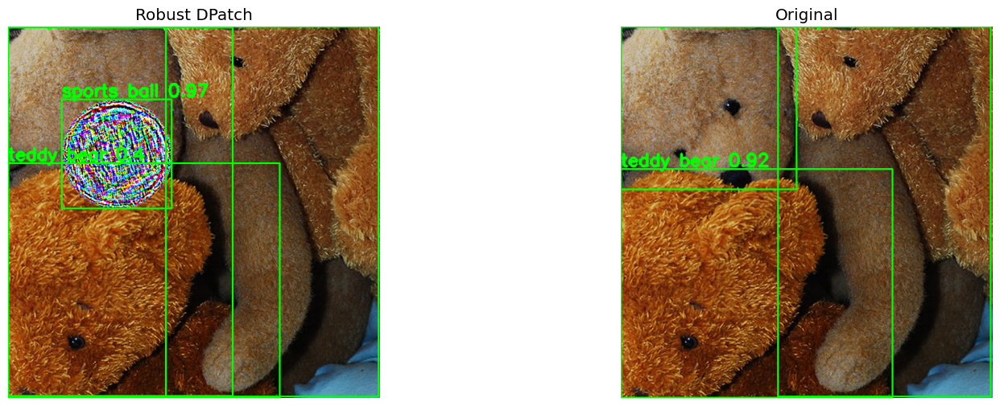

In [49]:
clean_preds = detector.model.predict(coco_images[:5])
patched_images = atk.apply_patch(coco_images[:5], 0.3)

# Проверяем эффективность атаки
patched_preds = detector.model.predict(patched_images)

for i in range(len(patched_preds)):
    fig, axs = plt.subplots(1, 2, figsize=(18, 6))

    # 1. Adversarial Image
    im_adv = (patched_images[i]).transpose(1, 2, 0) * 255
    im_adv_boxed = get_image_with_boxes(im_adv.copy(), patched_preds[i])
    axs[0].imshow(im_adv_boxed.astype("uint8"))
    axs[0].set_title("Robust DPatch")
    axs[0].axis("off")

    # 2. Original Image
    im_orig = (coco_images[i]).transpose(1, 2, 0) * 255
    im_orig_boxed = get_image_with_boxes(im_orig.copy(), clean_preds[i])
    axs[1].imshow(im_orig_boxed.astype("uint8"))
    axs[1].set_title("Original")
    axs[1].axis("off")

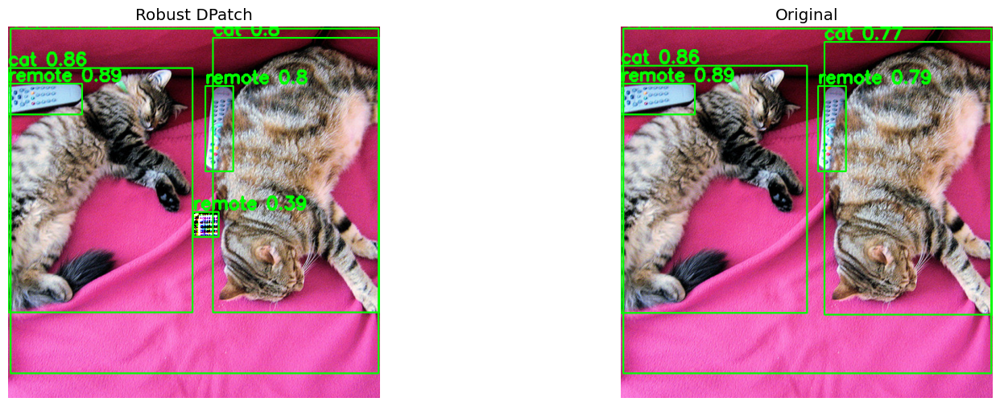

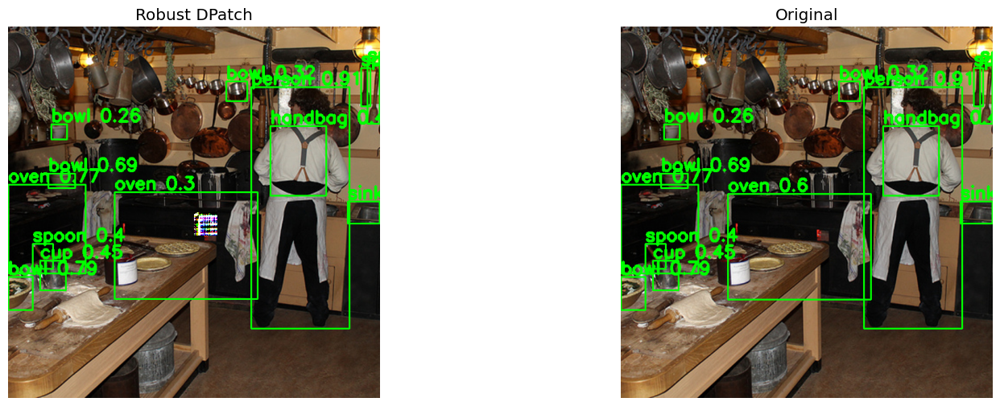

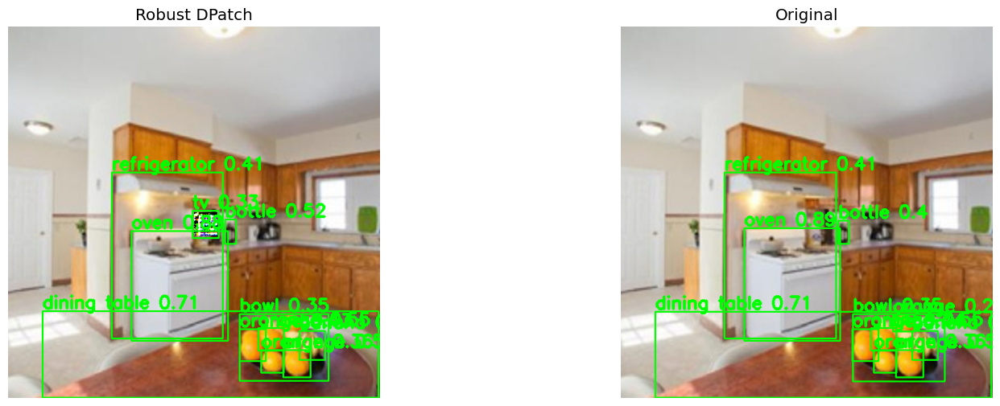

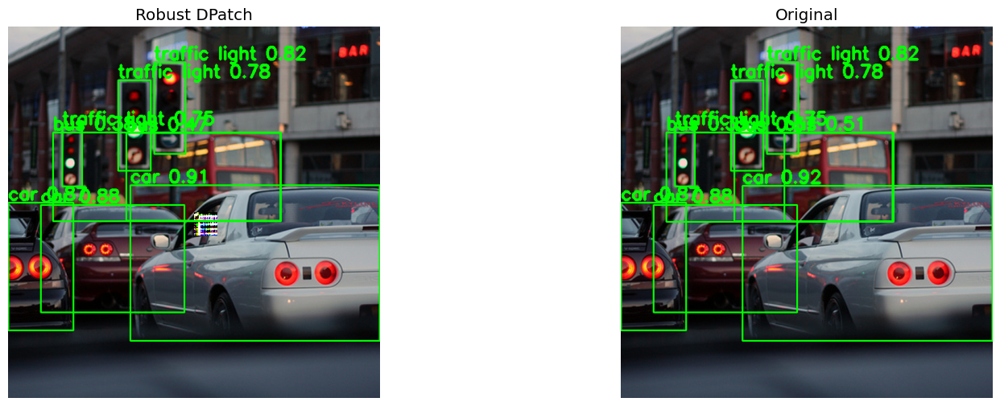

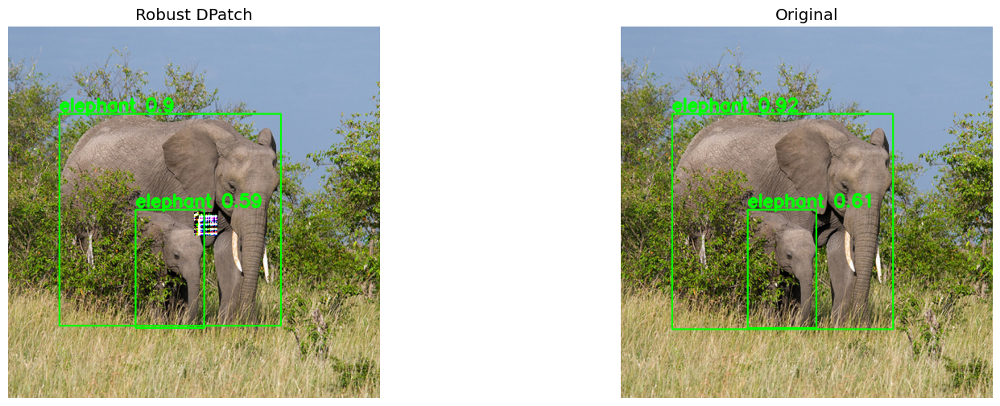

In [11]:
attack.patch_location = (320, 320)
patched_center = attack.apply_patch(coco_images)
patched_center_preds = detector.model.predict(patched_center)

for i in range(len(patched_preds)):
    fig, axs = plt.subplots(1, 2, figsize=(18, 6))

    # 1. Adversarial Image
    im_adv = (patched_center[i]).transpose(1, 2, 0) * 255
    im_adv_boxed = get_image_with_boxes(im_adv.copy(), patched_center_preds[i])
    axs[0].imshow(im_adv_boxed.astype("uint8"))
    axs[0].set_title("Robust DPatch")
    axs[0].axis("off")

    # 2. Original Image
    im_orig = (coco_images[i]).transpose(1, 2, 0) * 255
    im_orig_boxed = get_image_with_boxes(im_orig.copy(), clean_preds[i])
    axs[1].imshow(im_orig_boxed.astype("uint8"))
    axs[1].set_title("Original")
    axs[1].axis("off")

## DPatch

In [9]:
import copy

def change_labels_for_attack(
    labels_orig: list[dict[str, 'np.ndarray | torch.Tensor']],
    change_class: str | int | None = None,
    target_class: str | int | None = None,
    classes: list[str] | None = None
) -> list[dict[str, 'np.ndarray | torch.Tensor']]:
    """
    Modifies label classes for a targeted attack scenario.

    Takes a list of annotations and, depending on the parameters,
    either removes certain labels or changes their class to a target.

    Args:
        labels_orig: A list of annotations, where each item is a dictionary with:
            - 'boxes': np.ndarray or torch.Tensor of shape (N, 4)
            - 'labels': np.ndarray or torch.Tensor of length N with integer class IDs
            - 'scores': np.ndarray or torch.Tensor of length N with float confidence scores

        change_class: The class to be changed or removed.
            Can be a string (class name) or an integer (class ID).
            If None, all labels will be considered as the source class.

        target_class: The new class to assign to change_class labels.
            Can be a string (class name) or an integer (class ID).
            If None, labels of change_class will be removed.

        classes: A list of class names. Required if either change_class or
                 target_class is specified as a string.

    Returns:
        A new list of annotations with the same keys ('boxes', 'labels', 'scores'),
        but with modified label values.

    Example Scenarios:
        - change_class=None, target_class=None:
            Removes **all** labels.
        - change_class='cat', target_class=None:
            Removes all 'cat' class labels.
        - change_class=None, target_class='dog':
            Converts all labels to class 'dog'.
        - change_class='cat', target_class='dog':
            Converts 'cat' labels to 'dog'; all others remain unchanged.
    """
    if isinstance(change_class, str):
        if classes is None:
            raise ValueError("A list of classes must be provided when change_class is a string.")
        if change_class not in classes:
            raise ValueError(f"Class '{change_class}' not found in classes.")
        change_id = classes.index(change_class)
    else:
        change_id = change_class

    if isinstance(target_class, str):
        if classes is None:
            raise ValueError("A list of classes must be provided when target_class is a string.")
        if target_class not in classes:
            raise ValueError(f"Class '{target_class}' not found in classes.")
        target_id = classes.index(target_class)
    else:
        target_id = target_class

    if change_id is None and target_id is None:
        return [
            {
                'boxes': l['boxes'][:0],
                'scores': l['scores'][:0],
                'labels': l['labels'][:0],
            } for l in labels_orig
        ]

    labels = copy.deepcopy(labels_orig)

    if change_id is not None and target_id is None:
        for l in labels:
            keep = l['labels'] != change_id
            l['boxes'] = l['boxes'][keep]
            l['scores'] = l['scores'][keep]
            l['labels'] = l['labels'][keep]
        return labels

    if change_id is None and target_id is not None:
        for l in labels:
            l['labels'][:] = target_id
        return labels

    for l in labels:
        l['labels'][l['labels'] == change_id] = target_id

    return labels

def convert(data): # Че здесь происходит??????
    result = []
    for item in data:
        converted_item = {
            'boxes': np.array([[0, 0, 80, 80]]),
            'labels': np.array([0]),
            'scores': np.array([1]),
        }
        result.append(converted_item)
    return result

In [10]:
target = convert(change_labels_for_attack(detector.model.predict(torch.tensor(coco_images))))

C:\Users\ok__\AppData\Local\Temp\ipykernel_9608\556803461.py:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  results = self.orig_model(torch.tensor(x), verbose=False)


DPatch iteration:   0%|          | 0/10 [00:00<?, ?it/s]

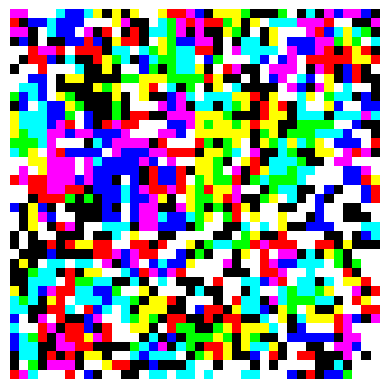

In [8]:
from art.attacks.evasion import RobustDPatch
from art.attacks.evasion import DPatch

detector.model.to('cpu')
ap = DPatch(
    detector,
    patch_shape=(3, 40, 40),
    max_iter=10,
    batch_size=1,
) 
patch = ap.generate(coco_images)

plt.axis("off")
plt.imshow(patch.transpose(1,2,0))
plt.show()

Либо DPatch из ART не может работать на GPU, либо я туплю

Сгенерируем пока на cpu

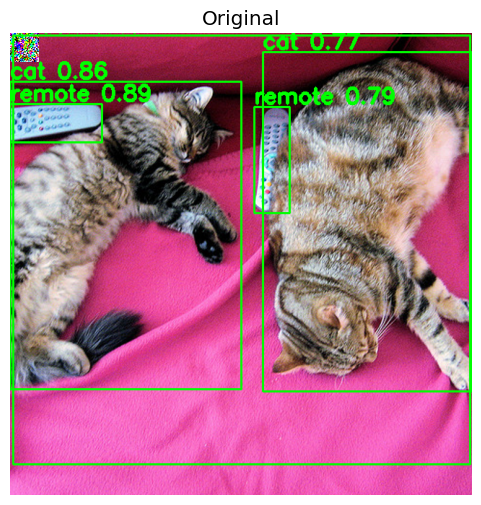

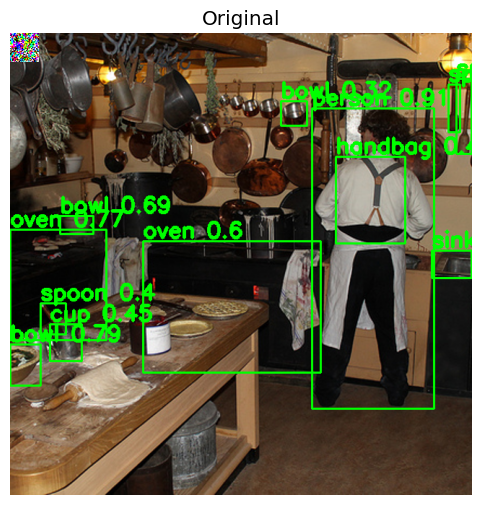

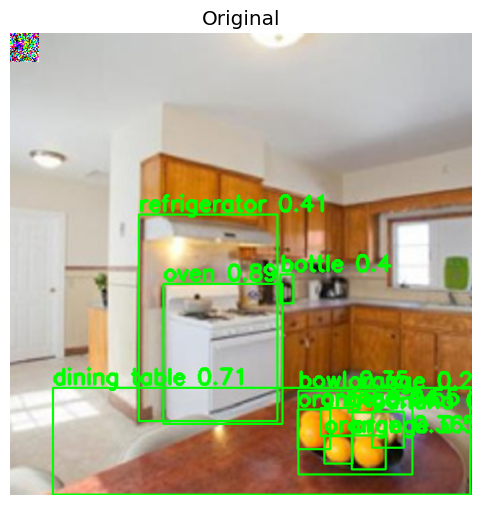

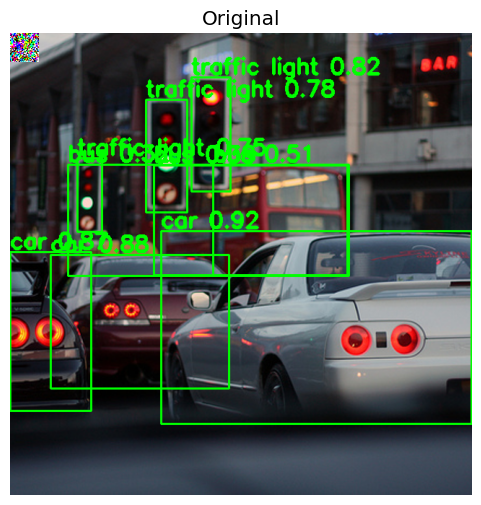

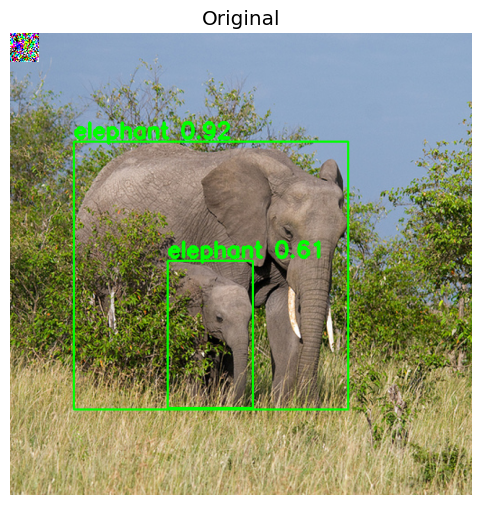

In [9]:
dpatched_images = ap.apply_patch(coco_images, patch)
dpatched_preds = detector.model.predict(dpatched_images)

for i, pred in enumerate(preds):
    fig, axs = plt.subplots(1, 1, figsize=(18, 6))

    im_orig = (dpatched_images[i]).transpose(1, 2, 0) * 255
    im_orig_boxed = get_image_with_boxes(im_orig.copy(), dpatched_preds[i])
    axs.imshow(im_orig_boxed.astype("uint8"))
    axs.set_title("Original")
    axs.axis("off")

Ну чет эффекта особо нет. Едем дальше